##Task 1: Exploratory Data Analysis (EDA):
1.	Load the dataset and perform basic data exploration.
2.	Examine the distribution of features using histograms, box plots, or density plots.
3.	Investigate correlations between features to understand relationships within the data.


In [104]:
# Importing the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [105]:
# Loading the dataset
wine = pd.read_csv('/content/wine.csv')
wine

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [106]:
wine.info()
# Here we can see there are 178 entries with 14 dimensions/columns.
# There are no null values present throughout.
# 'Type','Magnesium' and 'Proline' are of int64 dtype while rest of the columns are of float64 dtype.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Type             178 non-null    int64  
 1   Alcohol          178 non-null    float64
 2   Malic            178 non-null    float64
 3   Ash              178 non-null    float64
 4   Alcalinity       178 non-null    float64
 5   Magnesium        178 non-null    int64  
 6   Phenols          178 non-null    float64
 7   Flavanoids       178 non-null    float64
 8   Nonflavanoids    178 non-null    float64
 9   Proanthocyanins  178 non-null    float64
 10  Color            178 non-null    float64
 11  Hue              178 non-null    float64
 12  Dilution         178 non-null    float64
 13  Proline          178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [107]:
wine.describe()
# By checking the max and min, we can guess that there might be outliers present in the dataset
# Some of the columns has less variance.

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.775035,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


<Axes: >

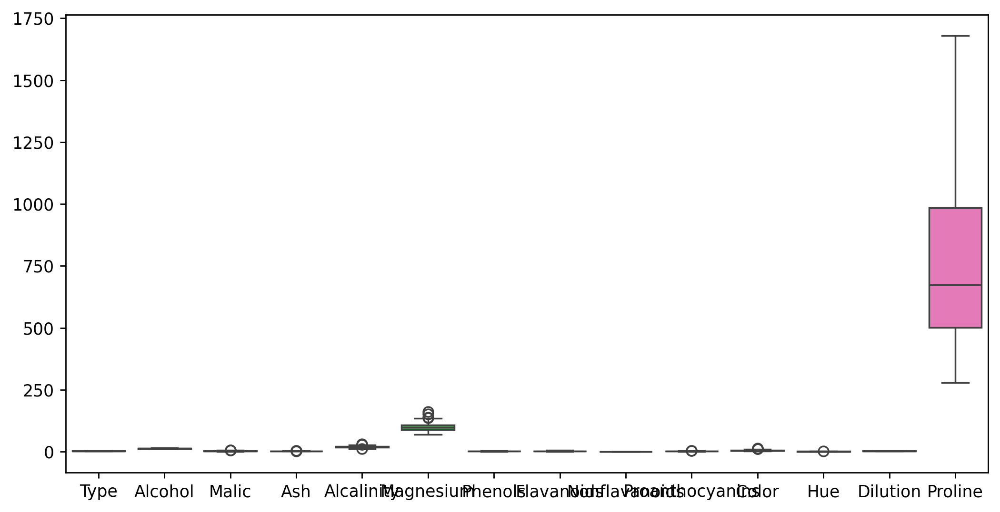

In [108]:
sns.boxplot(wine)
# Few of the columns have some outliers present

In [ ]:
sns.pairplot(wine)
# Phenols	Flavanoids dimensions have some correlation
# for the other columns we can cleary say, it is scattered or does not have great correlations with each other

array([[<Axes: title={'center': 'Type'}>,
        <Axes: title={'center': 'Alcohol'}>,
        <Axes: title={'center': 'Malic'}>,
        <Axes: title={'center': 'Ash'}>,
        <Axes: title={'center': 'Alcalinity'}>,
        <Axes: title={'center': 'Magnesium'}>,
        <Axes: title={'center': 'Phenols'}>],
       [<Axes: title={'center': 'Flavanoids'}>,
        <Axes: title={'center': 'Nonflavanoids'}>,
        <Axes: title={'center': 'Proanthocyanins'}>,
        <Axes: title={'center': 'Color'}>,
        <Axes: title={'center': 'Hue'}>,
        <Axes: title={'center': 'Dilution'}>,
        <Axes: title={'center': 'Proline'}>]], dtype=object)

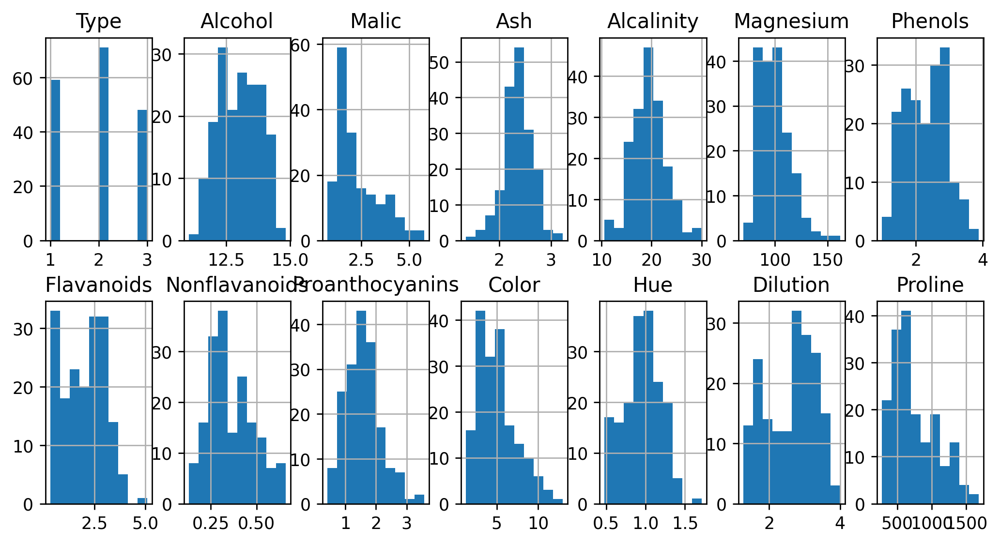

In [109]:
fig, axis = plt.subplots(2, 7)

#create histogram for each column in DataFrame
wine.hist(ax=axis)

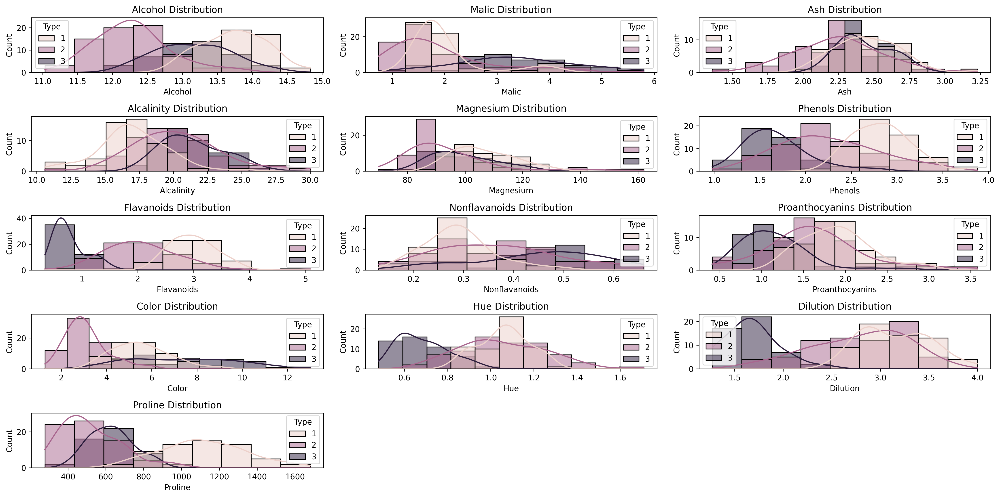

In [110]:
plt.figure(figsize=(18, 9))
for i, feature in enumerate(wine.columns[1:]):
    plt.subplot(5, 3, i + 1)
    sns.histplot(data=wine, x=feature, hue='Type', kde=True)
    plt.title(f'{feature} Distribution')
plt.tight_layout()
plt.show()

In [111]:
wine.corr()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
Type,1.000000,-0.328222,0.437776,-0.049643,0.517859,-0.209179,-0.719163,-0.847498,0.489109,-0.499130,0.265668,-0.617369,-0.788230,-0.633717
Alcohol,-0.328222,1.000000,0.094397,0.211545,-0.310235,0.270798,0.289101,0.236815,-0.155929,0.136698,0.546364,-0.071747,0.072343,0.643720
Malic,0.437776,0.094397,1.000000,0.164045,0.288500,-0.054575,-0.335167,-0.411007,0.292977,-0.220746,0.248985,-0.561296,-0.368710,-0.192011
Ash,-0.049643,0.211545,0.164045,1.000000,0.443367,0.286587,0.128980,0.115077,0.186230,0.009652,0.258887,-0.074667,0.003911,0.223626
Alcalinity,0.517859,-0.310235,0.288500,0.443367,1.000000,-0.083333,-0.321113,-0.351370,0.361922,-0.197327,0.018732,-0.273955,-0.276769,-0.440597
Magnesium,-0.209179,0.270798,-0.054575,0.286587,-0.083333,1.000000,0.214401,0.195784,-0.256294,0.236441,0.199950,0.055398,0.066004,0.393351
Phenols,-0.719163,0.289101,-0.335167,0.128980,-0.321113,0.214401,1.000000,0.864564,-0.449935,0.612413,-0.055136,0.433681,0.699949,0.498115
Flavanoids,-0.847498,0.236815,-0.411007,0.115077,-0.351370,0.195784,0.864564,1.000000,-0.537900,0.652692,-0.172379,0.543479,0.787194,0.494193
Nonflavanoids,0.489109,-0.155929,0.292977,0.186230,0.361922,-0.256294,-0.449935,-0.537900,1.000000,-0.365845,0.139057,-0.262640,-0.503270,-0.311385
Proanthocyanins,-0.499130,0.136698,-0.220746,0.009652,-0.197327,0.236441,0.612413,0.652692,-0.365845,1.000000,-0.025250,0.295544,0.519067,0.330417


<Axes: >

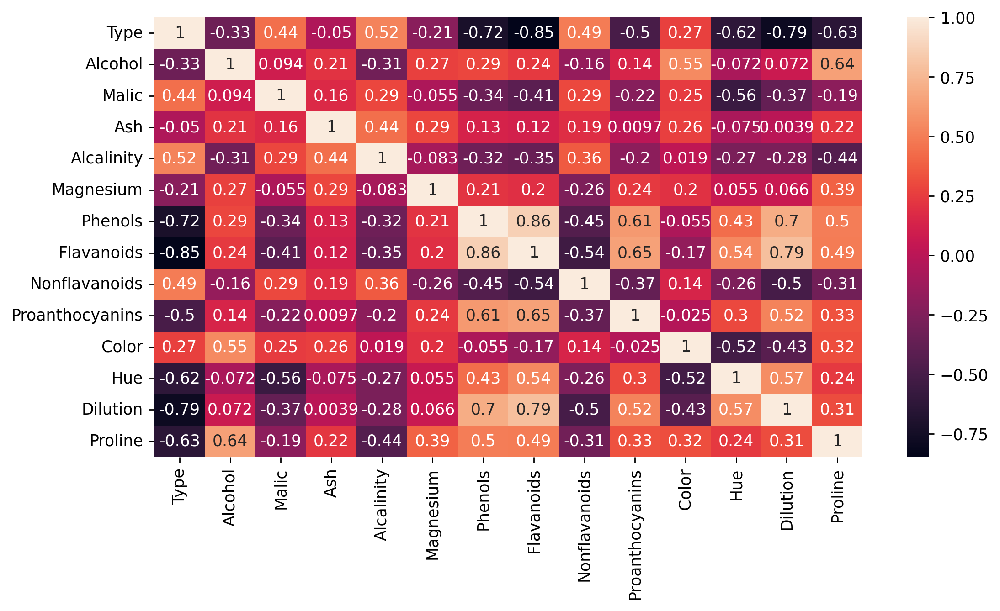

In [112]:
sns.heatmap(wine.corr(), annot=True)
# Phenols and Flavanoids dimensions have some correlation nearly about 0.86

##Task 2: Dimensionality Reduction with PCA:
1.	Standardize the features to ensure they have a mean of 0 and a standard deviation of Implement PCA to reduce the dimensionality of the dataset.
2.	Determine the optimal number of principal components using techniques like scree plot or cumulative explained variance.
3.	Transform the original dataset into the principal components.


In [113]:
# Excluding the first column as it is only the type which is not useful for model building.
wine_data = wine.iloc[:,1:]
wine_data.head()

,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [114]:
# Normalizing the numerical data
std = StandardScaler()
wine_normal = std.fit_transform(wine_data)
wine_normal

array([[ 1.51861254, -0.5622498 ,  0.23205254, ...,  0.36217728,
         1.84791957,  1.01300893],
       [ 0.24628963, -0.49941338, -0.82799632, ...,  0.40605066,
         1.1134493 ,  0.96524152],
       [ 0.19687903,  0.02123125,  1.10933436, ...,  0.31830389,
         0.78858745,  1.39514818],
       ...,
       [ 0.33275817,  1.74474449, -0.38935541, ..., -1.61212515,
        -1.48544548,  0.28057537],
       [ 0.20923168,  0.22769377,  0.01273209, ..., -1.56825176,
        -1.40069891,  0.29649784],
       [ 1.39508604,  1.58316512,  1.36520822, ..., -1.52437837,
        -1.42894777, -0.59516041]])

In [115]:
from sklearn.decomposition import PCA

pca = PCA()
pca_components = pca.fit_transform(wine_normal)

In [ ]:
# After removing multicollinearity using PCA
sns.pairplot(pd.DataFrame(pca_components))

In [116]:
# The amount of variance that each PCA explains
pca.explained_variance_

array([4.73243698, 2.51108093, 1.45424187, 0.92416587, 0.85804868,
       0.64528221, 0.55414147, 0.35046627, 0.29051203, 0.25232001,
       0.22706428, 0.16972374, 0.10396199])

In [117]:
# in percentage - The amount of variance that each PCA explains
var = pca.explained_variance_ratio_
var

array([0.36198848, 0.1920749 , 0.11123631, 0.0706903 , 0.06563294,
       0.04935823, 0.04238679, 0.02680749, 0.02222153, 0.01930019,
       0.01736836, 0.01298233, 0.00795215])

In [118]:
var1 = np.cumsum(np.round(var, decimals=4)*100)
var1

array([ 36.2 ,  55.41,  66.53,  73.6 ,  80.16,  85.1 ,  89.34,  92.02,
        94.24,  96.17,  97.91,  99.21, 100.01])

In [119]:
# 13 dimensional components
pca.components_

array([[ 0.1443294 , -0.24518758, -0.00205106, -0.23932041,  0.14199204,
         0.39466085,  0.4229343 , -0.2985331 ,  0.31342949, -0.0886167 ,
         0.29671456,  0.37616741,  0.28675223],
       [-0.48365155, -0.22493093, -0.31606881,  0.0105905 , -0.299634  ,
        -0.06503951,  0.00335981, -0.02877949, -0.03930172, -0.52999567,
         0.27923515,  0.16449619, -0.36490283],
       [-0.20738262,  0.08901289,  0.6262239 ,  0.61208035,  0.13075693,
         0.14617896,  0.1506819 ,  0.17036816,  0.14945431, -0.13730621,
         0.08522192,  0.16600459, -0.12674592],
       [-0.0178563 ,  0.53689028, -0.21417556,  0.06085941, -0.35179658,
         0.19806835,  0.15229479, -0.20330102,  0.39905653,  0.06592568,
        -0.42777141,  0.18412074, -0.23207086],
       [-0.26566365,  0.03521363, -0.14302547,  0.06610294,  0.72704851,
        -0.14931841, -0.10902584, -0.50070298,  0.13685982, -0.07643678,
        -0.17361452, -0.10116099, -0.1578688 ],
       [-0.21353865, -0.536813

Text(0.5, 1.0, 'Effect of PCA on the features')

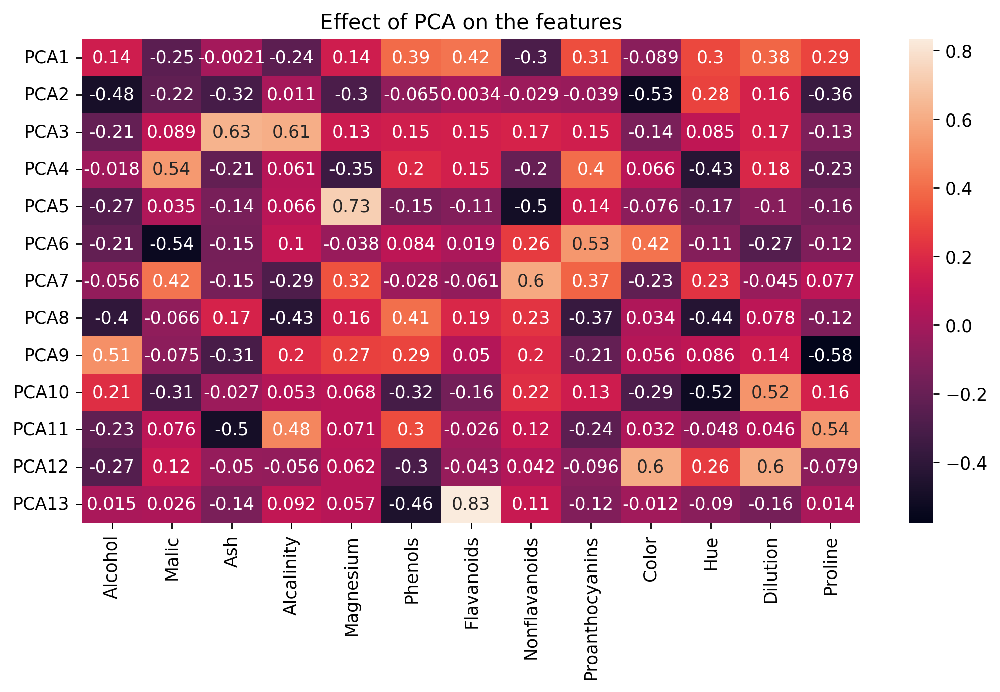

In [120]:
component_df=pd.DataFrame(pca.components_,
                          index=['PCA1',"PCA2",'PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11','PCA12','PCA13'],
                          columns=wine_data.columns)
# Heat map
sns.heatmap(component_df,annot=True)
plt.title('Effect of PCA on the features')

Text(0, 0.5, 'Percentage')

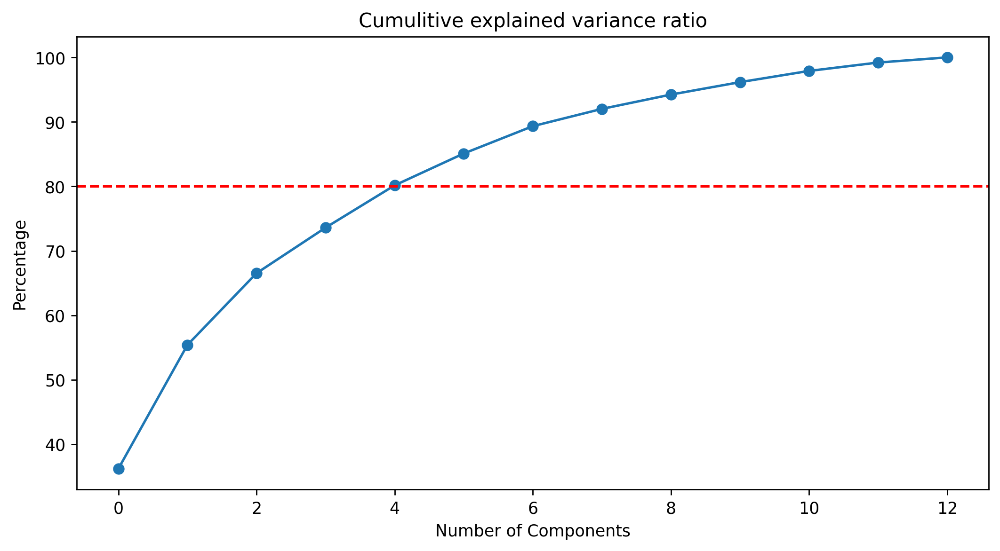

In [122]:
plt.plot(var1,marker='o')
plt.axhline(y=80, linestyle='--', color='red')
plt.title('Cumulitive explained variance ratio')
plt.xlabel('Number of Components')
plt.ylabel('Percentage')
# Cumulitive explained variance ratio
# Here we can see that, uptil the 5th dimension 80% of the variance is taken

Here we can cleary see that, 5 dimesions -PC1,PC2,PC3,PC4,PC5 are enough to describe the data as 80% of the variance can be decribed.

Text(0.5, 0, 'Number of features')

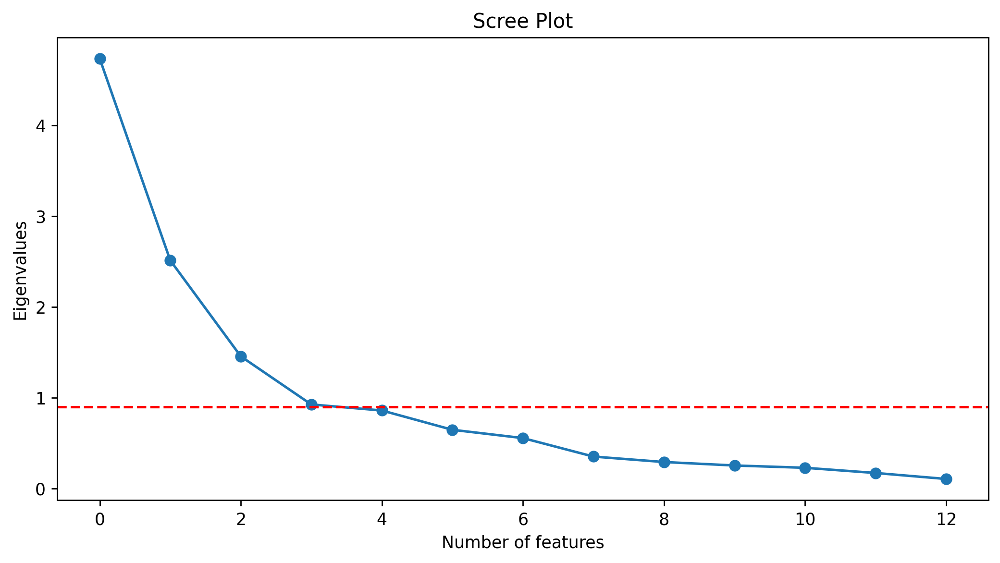

In [124]:
plt.plot(pca.explained_variance_,marker='o')
plt.axhline(y=0.9, linestyle='--', color='red')
plt.title('Scree Plot')
plt.ylabel('Eigenvalues')
plt.xlabel('Number of features')
# Elbow at 4th dimension

 According to the eigenvalue/ scree plot, PC1, PC2 and PC3 are enough to provide the information as they are greater than 1.

##Task 3: Clustering with Original Data:
1.	Apply a clustering algorithm (e.g., K-means) to the original dataset.
2.	Visualize the clustering results using appropriate plots.
3.	Evaluate the clustering performance using metrics such as silhouette score or Davies–Bouldin index.


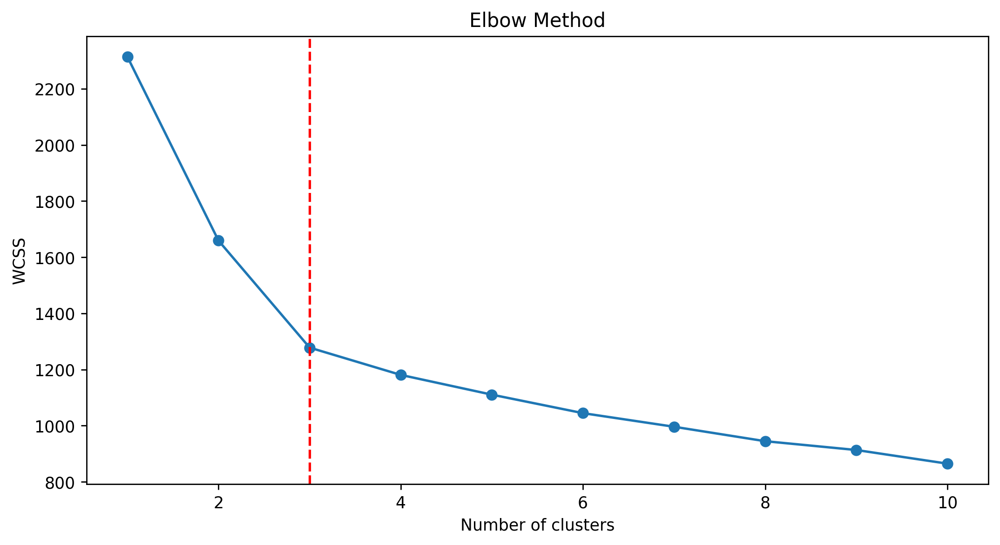

In [125]:
from sklearn.cluster import KMeans
# Good model is the one with low inertia AND a low number of clusters(K)
# Suppose K=10 and creating a loop to make a list of 10 wcss
wcss=[]
for i in range(1,11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, random_state=0)
    kmeans.fit(wine_normal)
    wcss.append(kmeans.inertia_)

plt.plot(range(1,11), wcss, marker='o')
plt.axvline(x=3, linestyle='--', color='red')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()
# We can see that the bend is at the 3

In [126]:
wcss

[2313.9999999999986,
 1659.0079672511504,
 1277.928488844643,
 1180.7375750559927,
 1110.3654015546044,
 1044.4697711080585,
 995.9946185946652,
 944.5588859722102,
 913.1973405418785,
 864.5780952523822]

In [127]:
kmeans = KMeans(n_clusters=3,random_state=0) # pass no. of clusters as 3
predict_3=kmeans.fit_predict(wine_normal)# assign cluster numbers to IDs
predict_3

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int32)

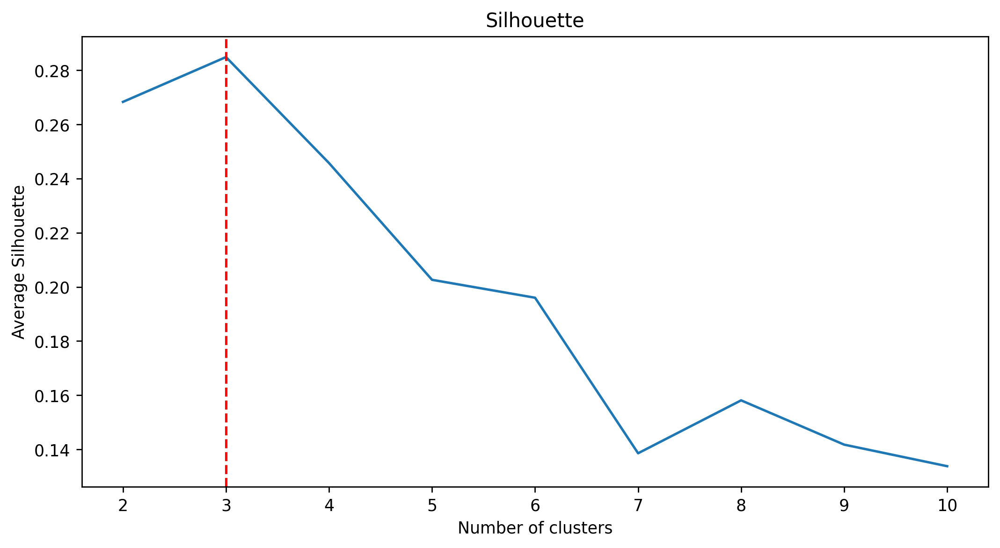

In [128]:
# Using Silhouette score
from sklearn.metrics import silhouette_score
sil = [] # Within cluster sum of square
for i in range(2,11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(wine_normal)
    kmeans_labels = kmeans.fit_predict(wine_normal)
    sil.append(silhouette_score(wine_normal, kmeans_labels))

plt.plot(range(2,11), sil)
plt.title('Silhouette')
plt.axvline(x=3, linestyle = '--', color='red')
plt.xlabel('Number of clusters')
plt.ylabel('Average Silhouette')
plt.show()

In [129]:
from sklearn.metrics import davies_bouldin_score
db_index = davies_bouldin_score(wine_normal, predict_3)
print(f"Davies-Bouldin Index: {db_index}")
# Very low DB index value
# it indicates that the clusters are well-separated and compact
# which is a good indication of a successful clustering solution

Davies-Bouldin Index: 1.3891879777181648


In [130]:
Clusters_kmean_3 = pd.DataFrame(predict_3, columns=['Cluster_No'])
KM_wine_3 = wine.join(Clusters_kmean_3)
KM_wine_3

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Cluster_No
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,2
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,2
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,2
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,2
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740,1
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750,1
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835,1
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840,1


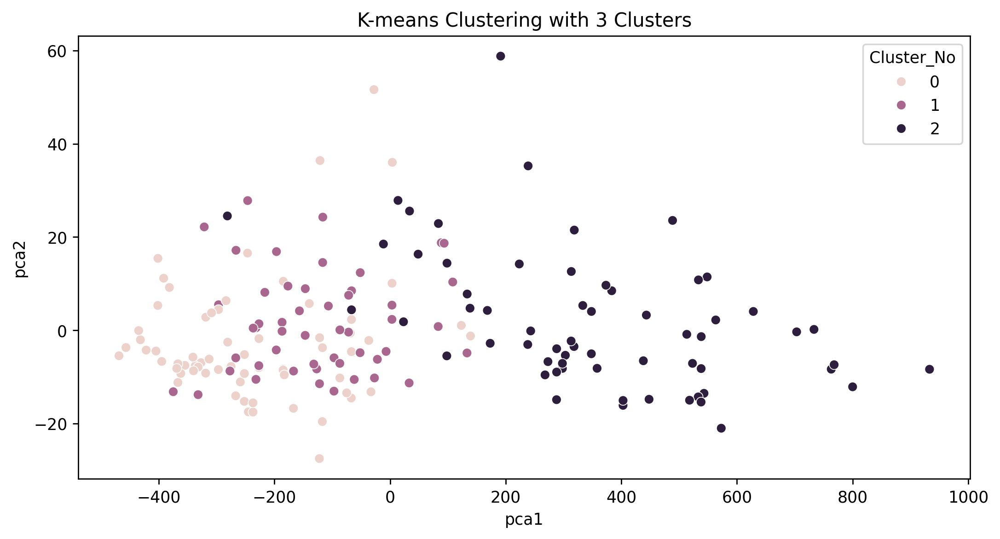

In [131]:
#Scatter diagram for 3 clusters using K-means
from sklearn.decomposition import PCA
pca_num_components = 2

reduced_data = PCA(n_components=pca_num_components).fit_transform(KM_wine_3)
results = pd.DataFrame(reduced_data,columns=['pca1','pca2'])

sns.scatterplot(x="pca1", y="pca2", hue=KM_wine_3['Cluster_No'], data=results)
plt.title('K-means Clustering with 3 Clusters')
plt.show()

##Task 4: Clustering with PCA Data:
1.	Apply the same clustering algorithm to the PCA-transformed dataset.
2.	Visualize the clustering results obtained from PCA-transformed data.
3.	Compare the clustering results from PCA-transformed data with those from the original dataset.


In [132]:
# Using the Cumulitive explained variance ratio plot if we take 5 principle components
reduced_data = PCA(n_components=5).fit_transform(wine_normal)
PCA_trans = pd.DataFrame(reduced_data,columns=['pca1','pca2','pca3','pca4','pca5'])
PCA_trans

,pca1,pca2,pca3,pca4,pca5
0,3.316751,-1.443463,-0.165739,-0.215631,0.693043
1,2.209465,0.333393,-2.026457,-0.291358,-0.257655
2,2.516740,-1.031151,0.982819,0.724902,-0.251033
3,3.757066,-2.756372,-0.176192,0.567983,-0.311842
4,1.008908,-0.869831,2.026688,-0.409766,0.298458
...,...,...,...,...,...
173,-3.370524,-2.216289,-0.342570,1.058527,-0.574164
174,-2.601956,-1.757229,0.207581,0.349496,0.255063
175,-2.677839,-2.760899,-0.940942,0.312035,1.271355
176,-2.387017,-2.297347,-0.550696,-0.688285,0.813955


In [133]:
kmeans = KMeans(n_clusters=3,random_state=0) # pass no. of clusters as 3
predict_PCA_3=kmeans.fit_predict(PCA_trans)# assign cluster numbers to IDs
PCA_kmean_3 = pd.DataFrame(predict_PCA_3, columns=['Cluster_No'])
KM_PCA_trans_3 = PCA_trans.join(PCA_kmean_3)
KM_PCA_trans_3

,pca1,pca2,pca3,pca4,pca5,Cluster_No
0,3.316751,-1.443463,-0.165739,-0.215631,0.693043,2
1,2.209465,0.333393,-2.026457,-0.291358,-0.257655,2
2,2.516740,-1.031151,0.982819,0.724902,-0.251033,2
3,3.757066,-2.756372,-0.176192,0.567983,-0.311842,2
4,1.008908,-0.869831,2.026688,-0.409766,0.298458,2
...,...,...,...,...,...,...
173,-3.370524,-2.216289,-0.342570,1.058527,-0.574164,1
174,-2.601956,-1.757229,0.207581,0.349496,0.255063,1
175,-2.677839,-2.760899,-0.940942,0.312035,1.271355,1
176,-2.387017,-2.297347,-0.550696,-0.688285,0.813955,1


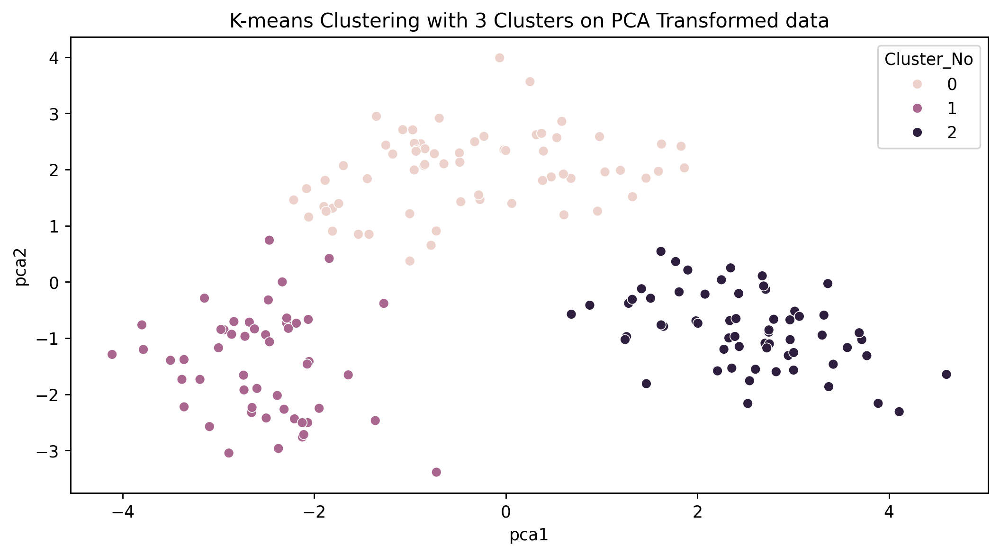

In [134]:
#Scatter diagram for 3 clusters using K-means
from sklearn.decomposition import PCA
pca_num_components = 2

reduced_data = PCA(n_components=pca_num_components).fit_transform(KM_PCA_trans_3)
results = pd.DataFrame(reduced_data,columns=['pca1','pca2'])

sns.scatterplot(x="pca1", y="pca2", hue=KM_PCA_trans_3['Cluster_No'], data=results)
plt.title('K-means Clustering with 3 Clusters on PCA Transformed data')
plt.show()

In [135]:
# Using the Scree plot if we take 3 principle components
reduced_data = PCA(n_components=3).fit_transform(wine_normal)
PCA_trans = pd.DataFrame(reduced_data,columns=['pca1','pca2','pca3'])
PCA_trans

,pca1,pca2,pca3
0,3.316751,-1.443463,-0.165739
1,2.209465,0.333393,-2.026457
2,2.516740,-1.031151,0.982819
3,3.757066,-2.756372,-0.176192
4,1.008908,-0.869831,2.026688
...,...,...,...
173,-3.370524,-2.216289,-0.342570
174,-2.601956,-1.757229,0.207581
175,-2.677839,-2.760899,-0.940942
176,-2.387017,-2.297347,-0.550696


In [136]:
kmeans = KMeans(n_clusters=3,random_state=0) # pass no. of clusters as 3
predict_PCA_3=kmeans.fit_predict(PCA_trans)# assign cluster numbers to IDs
PCA_kmean_3 = pd.DataFrame(predict_PCA_3, columns=['Cluster_No'])
KM_PCA_trans_3 = PCA_trans.join(PCA_kmean_3)
KM_PCA_trans_3

,pca1,pca2,pca3,Cluster_No
0,3.316751,-1.443463,-0.165739,2
1,2.209465,0.333393,-2.026457,2
2,2.516740,-1.031151,0.982819,2
3,3.757066,-2.756372,-0.176192,2
4,1.008908,-0.869831,2.026688,2
...,...,...,...,...
173,-3.370524,-2.216289,-0.342570,1
174,-2.601956,-1.757229,0.207581,1
175,-2.677839,-2.760899,-0.940942,1
176,-2.387017,-2.297347,-0.550696,1


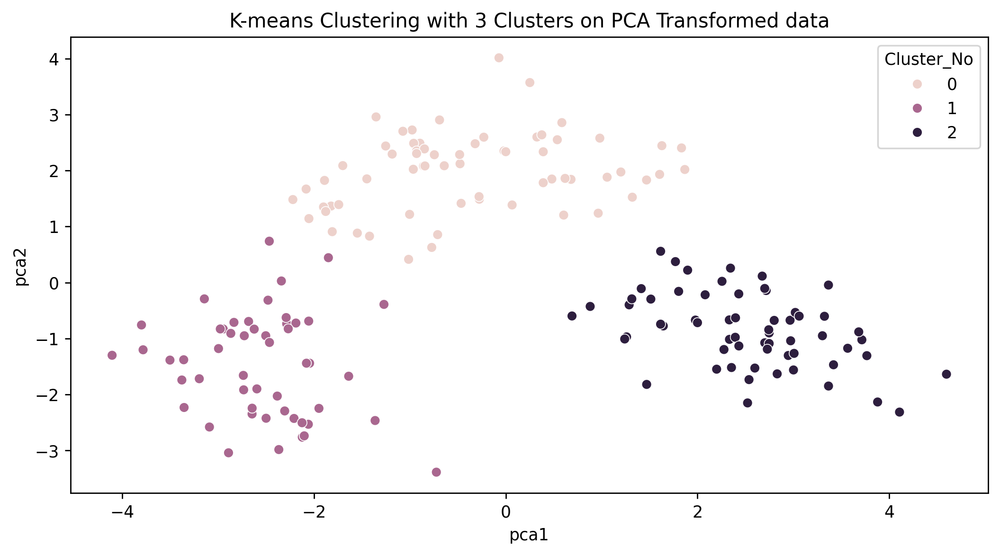

In [137]:
#Scatter diagram for 3 clusters using K-means
from sklearn.decomposition import PCA
pca_num_components = 2

reduced_data = PCA(n_components=pca_num_components).fit_transform(KM_PCA_trans_3)
results = pd.DataFrame(reduced_data,columns=['pca1','pca2'])

sns.scatterplot(x="pca1", y="pca2", hue=KM_PCA_trans_3['Cluster_No'], data=results)
plt.title('K-means Clustering with 3 Clusters on PCA Transformed data')
plt.show()

#### We dont see much of the difference between taking 3 pca components and 5 pca components

##Task 5: Comparison and Analysis:
1.	Compare the clustering results obtained from the original dataset and PCA-transformed data.
2.	Discuss any similarities or differences observed in the clustering results.
3.	Reflect on the impact of dimensionality reduction on clustering performance.
4.	Analyze the trade-offs between using PCA and clustering directly on the original dataset.


### Answers
All of the clusters in the K-Means Clustering without PCA transformation are jumbled all together. However, When we employ PCA prior to using K-means, we can visually separate almost the entire data set.

Hence, the centroids of each of the clusters can be seen clearly with separated and distributed manner in PCA transformed clustering than the original clustering.

This helps us to visualize and analyse the data clearly with removing the multi-collinearity. As we can see in the pairplot as well, the collinearity between the 2 columns has been removed and this helps to buid the model efficiently.

Due to PCA, columns are reduced such a way that most of the information is been taken to build the model, which reduces the complexity and the data is also preserved.

##Task 6: Conclusion and Insights

1.	Summarize the key findings and insights from the assignment.
2.	Discuss the practical implications of using PCA and clustering in data analysis.
3.	Provide recommendations for when to use each technique based on the analysis conducted.


###Answers
We apply PCA to reduce the dimensionality of the dataset, identifying the key components that capture the majority of variance. And We use Clustering on the principal components to identify distinct zone clearly.

This enhances the interpretability and helps to improvise the efficiency and the analysis.

By integrating such methods, geographical researchers, environmentalists can analyse complex spatial data and identify meaningful patterns.